In [1]:
pwd

'C:\\Users\\Saanika'

<class 'numpy.ndarray'>


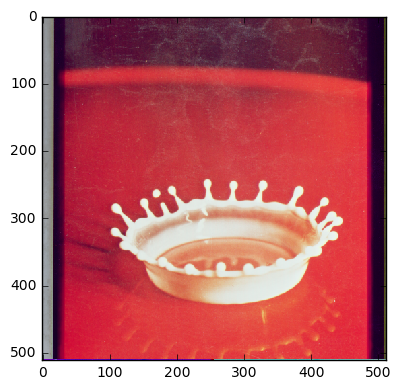

In [2]:
%matplotlib inline

import skimage.io as io
img = io.imread('new/4.2.01.tiff')
print(type(img))
io.imshow(img)
io.show()

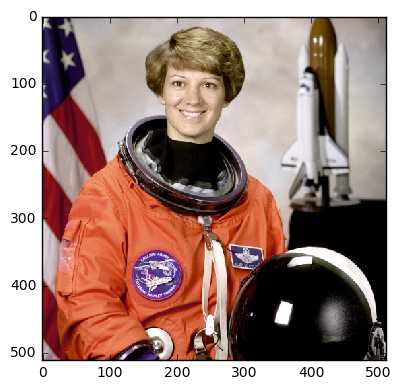

In [3]:
import skimage.data as data

img = data.astronaut() # built-in images
io.imshow(img)
io.show()

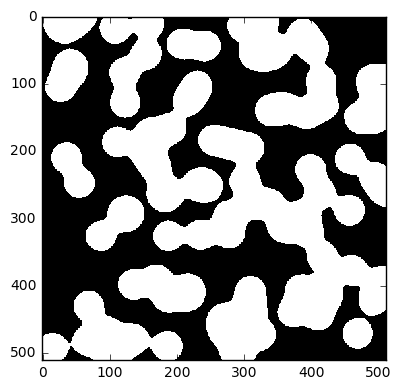

In [13]:
img = data.binary_blobs(length=512, blob_size_fraction=0.1, seed=5)
io.imshow(img)
io.show()

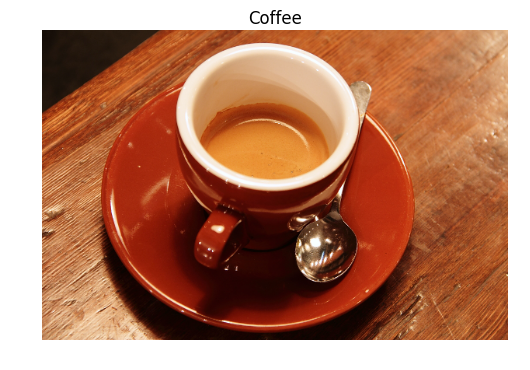

In [4]:
import matplotlib.pyplot as plt

img = data.coffee()

plt.imshow(img)
plt.title('Coffee')
plt.axis('off')
plt.show()

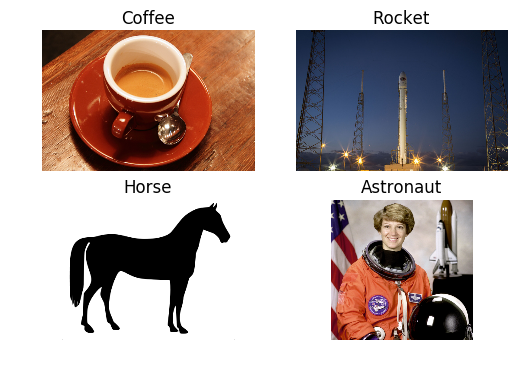

In [15]:
img1 = data.coffee()
img2 = data.rocket()
img3 = data.horse()
img4 = data.astronaut()

titles = ['Coffee', 'Rocket', 'Horse', 'Astronaut']
images = [img1, img2, img3, img4]

for i in range(4):
    plt.subplot(2, 2, i+1)
    if i == 2:
        plt.imshow(images[i], cmap='gray')
    else:
        plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.show()

# Shapes

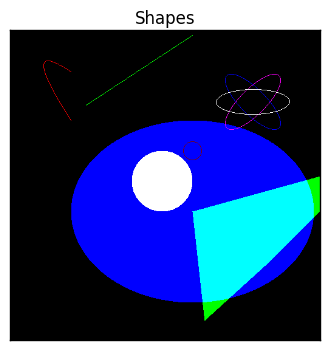

In [33]:
%matplotlib inline
import matplotlib.pyplot as plt
import math
import numpy as np
from skimage.draw import (line, polygon, circle,
                          circle_perimeter,
                          ellipse, ellipse_perimeter,
                          bezier_curve)

img = np.zeros((512, 512, 3), dtype=np.double) # black canvas

rr, cc = line(125, 125, 10, 300) # x1 = 125, y1 = 125, x2 = 10, y2 = 300
img[rr, cc, 1] = 1 # list of points is set to 1

poly = np.array((
    (300, 300),
    (480, 320),
    (380, 430),
    (220, 590),
    (300, 300),
))
rr, cc = polygon(poly[:, 0], poly[:, 1], img.shape)
img[rr, cc, 1] = 1

rr, cc = circle(250, 250, 50, img.shape) # center = (250, 250), radius = 50
img[rr, cc, :] = (1, 1, 0) # combination of red and green

rr, cc = ellipse(300, 300, 150, 200, img.shape) # major-axis = 150, minor-axis = 200
img[rr, cc, 2] = 1

rr, cc = circle_perimeter(200, 300, 15)
img[rr, cc, :] = (0.5, 0, 0)

rr, cc = bezier_curve(70, 100, 10, 10, 150, 100, 1)
img[rr, cc, :] = (1, 0, 0)

rr, cc = ellipse_perimeter(120, 400, 60, 20, orientation=math.pi / 4.)
img[rr, cc, :] = (1, 0, 1)

rr, cc = ellipse_perimeter(120, 400, 60, 20, orientation=-math.pi / 4.)
img[rr, cc, :] = (0, 0, 1)

rr, cc = ellipse_perimeter(120, 400, 60, 20, orientation=math.pi / 2.)
img[rr, cc, :] = (1, 1, 1)

plt.imshow(img)
plt.title('Shapes')
plt.xticks([])
plt.yticks([])
plt.show()

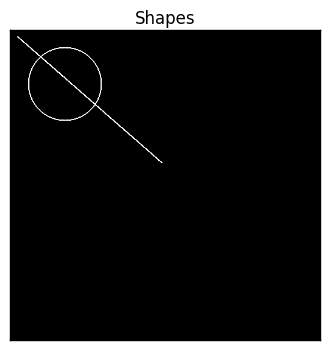

In [32]:
# for smooth curves
from skimage.draw import line_aa, circle_perimeter_aa

img = np.zeros((512, 512, 3), dtype=np.double)

rr, cc, val = line_aa(12, 12, 220, 250)
img[rr, cc, :] = [1, 1, 1]

rr, cc, val = circle_perimeter_aa(90, 90, 60)
img[rr, cc, :] = [1, 1, 1]

plt.imshow(img)
plt.title('Shapes')
plt.xticks([])
plt.yticks([])
plt.show()

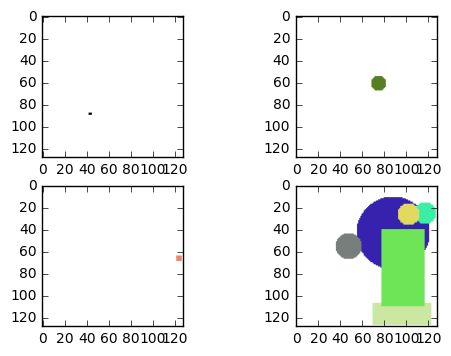

In [6]:
from skimage.draw import random_shapes

image0, _ = random_shapes((128, 128), max_shapes=1, shape='rectangle',
                       multichannel=False) # grayscale rectangle

image1, _ = random_shapes((128, 128), max_shapes=1, shape='circle')

image2, _ = random_shapes((128, 128), max_shapes=10,
                          intensity_range=((100, 255),))

image3, _ = random_shapes((128, 128), min_shapes=5, max_shapes=10,
                         min_size=20, allow_overlap=True)


images = [image0, image1, image2, image3]

for i in range(4):
    plt.subplot(2, 2, i+1)
    if i == 0:
        plt.imshow(images[i], cmap='gray')
    else:
        plt.imshow(images[i])

plt.show()

# Colorspace conversion

In [12]:
%matplotlib inline
from skimage import data
from skimage.color import convert_colorspace
import matplotlib.pyplot as plt


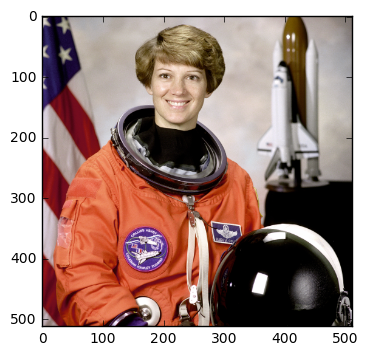

In [13]:
img = data.astronaut()
plt.imshow(img)

In [15]:
img_hsv = convert_colorspace(img, 'RGB', 'HSV')

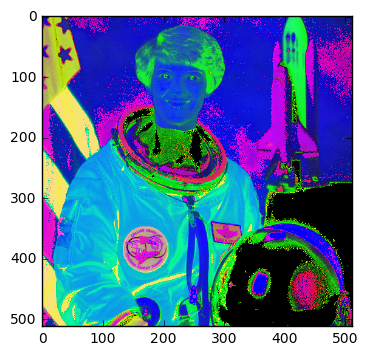

In [16]:
plt.imshow(img_hsv)
plt.show()

In [25]:
from skimage.color import rgb2gray, rgb2grey
img_grey = rgb2gray(img)

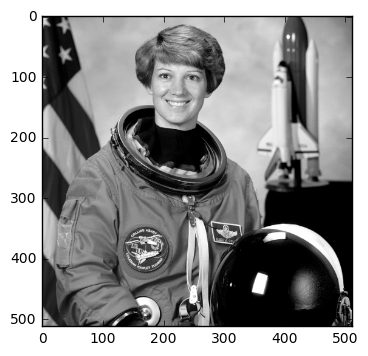

In [26]:
plt.imshow(img_grey, cmap = 'gray')
plt.show()

# Thresholding

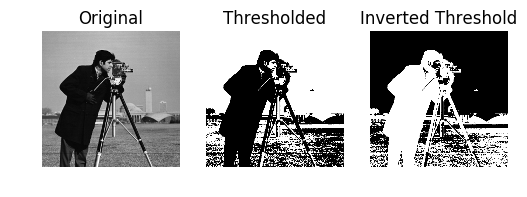

In [29]:
# Thresholding gives binary images
%matplotlib inline
import matplotlib.pyplot as plt
import skimage.data as data

img = data.camera()

thresh = 127

output1 = img > thresh
output2 = img <= thresh

output = [img, output1, output2]
titles = ['Original', 'Thresholded', 'Inverted Threshold']

for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(output[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.show()

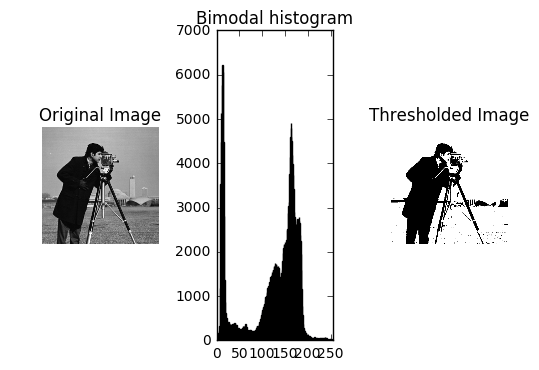

In [30]:
from skimage.filters import threshold_otsu

thresh = threshold_otsu(img)
binary = img > thresh
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(img, cmap = 'gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Bimodal histogram')
plt.hist(img.ravel(), bins = 256, range = [0, 255])
plt.xlim([0, 255])

plt.subplot(1, 3, 3)
plt.title('Thresholded Image')
plt.imshow(binary, cmap = 'gray')
plt.axis('off')

plt.show()

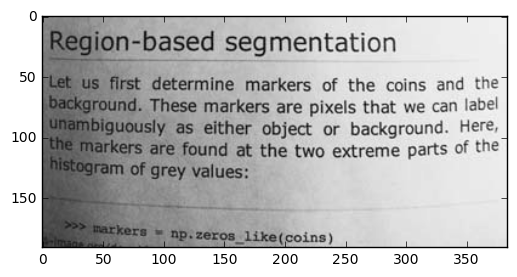

In [28]:
from skimage.filters import threshold_local

img = data.page()

thresh = threshold_otsu(img)
otsu = img > thresh

adaptive = threshold_local(img, block_size = 3, offset = 30)

plt.imshow(adaptive, cmap = 'gray')
plt.show()

# Transformations

In [33]:
%matplotlib inline
import math
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage import transform as tf

img = data.astronaut()

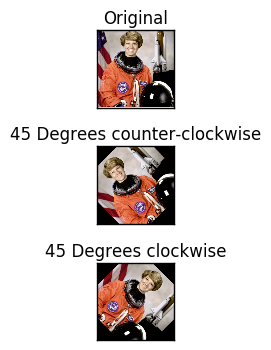

In [38]:
# Similarity Transform

tform = tf.SimilarityTransform(scale=1, rotation=math.pi/4,
translation = (img.shape[0]/2, -100))

print(tform)

output1 = tf.warp(img, tform)

output2 = tf.warp(img, tform.inverse)

output = [img, output1, output2]
titles = ['Original', '45 Degrees counter-clockwise', '45 Degrees clockwise']

plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

for i in range(3):
    plt.subplot(3, 1, i+1)
    plt.imshow(output[i])
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()

C:\Users\Saanika\Anaconda3\lib\site-packages\skimage\transform\_warps.py:499: UserWarning: The default of `mode` in `skimage.transform.swirl` will change to `reflect` in version 0.15.
  warn('The default of `mode` in `skimage.transform.swirl` '


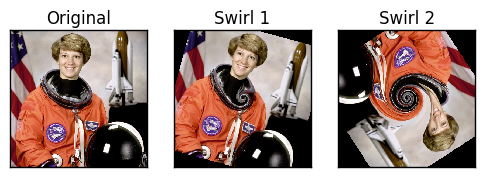

In [40]:
# Swirl

output1 = tf.swirl(img, rotation = 50, strength = 10, radius = 120)
output2 = tf.swirl(img, rotation = 10, strength = 20, radius = 200)

output = [img, output1, output2]
titles = ['Original', 'Swirl 1', 'Swirl 2']

for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(output[i], interpolation = 'nearest')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()

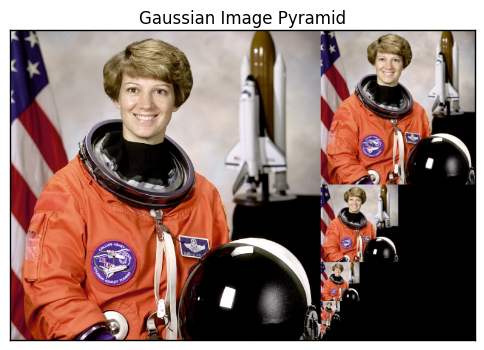

In [41]:
# Gaussian Pyramid

rows, cols, dim = img.shape
pyramid = tuple(tf.pyramid_gaussian(img, downscale = 2, multichannel = True))

composite_image = np.zeros((rows, cols + cols // 2, 3), dtype=np.double)

composite_image[:rows, :cols, :] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
    i_row += n_rows

fig, ax = plt.subplots()
ax.imshow(composite_image)

plt.xticks([])
plt.yticks([])
plt.title('Gaussian Image Pyramid')
    
plt.show()

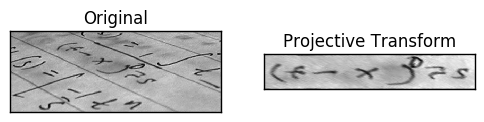

In [42]:
# Projective Transform

img = data.text()

src = np.array([[0, 0], [0, 50], [300, 50], [300, 0]])
dst = np.array([[155, 15], [65, 40], [260, 130], [360, 95]])

tform = tf.ProjectiveTransform()
tform.estimate(src, dst)
output1 = tf.warp(img, tform, output_shape=(50, 300))

output = [img, output1]
titles = ['Original', 'Projective Transform']

for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.imshow(output[i], cmap = 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])

plt.show()

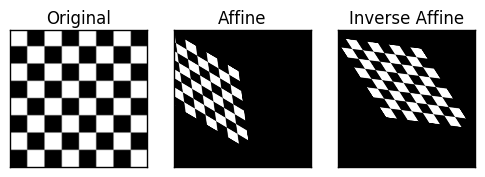

In [43]:
# Affine Transformation

img = data.checkerboard()

tform = tf.AffineTransform(scale = (1.2, 1.1), rotation = 1, shear = 0.7,
translation = (210, 50))

output1 = tf.warp(img, tform, output_shape = (350, 350))
output2 = tf.warp(img, tform.inverse, output_shape = (350, 350))

output = [img, output1, output2]
titles = ['Original', 'Affine', 'Inverse Affine']

for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(output[i], cmap = 'gray')
    plt.xticks([]), plt.yticks([])
    plt.title(titles[i])
plt.show()

C:\Users\Saanika\Anaconda3\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
C:\Users\Saanika\Anaconda3\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


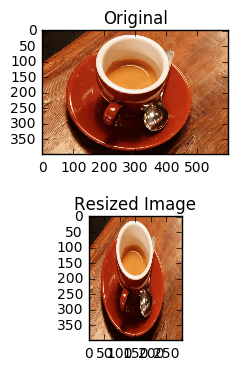

In [44]:
# Resizing the image

img = data.coffee()

output1 = tf.resize(img, (img.shape[0], img.shape[1] * 1/2))

plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

output = [img, output1]
titles = ['Original', 'Resized Image']

for i in range(2):
    plt.subplot(2, 1, i+1)
    plt.imshow(output[i])
    plt.title(titles[i])
plt.show()

# Histogram Equalization

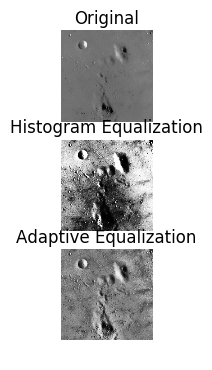

In [45]:
%matplotlib inline

import matplotlib.pyplot as plt
from skimage import data
from skimage import exposure

img = data.moon()

img_eq =  exposure.equalize_hist(img)

img_adapthist = exposure.equalize_adapthist(img, clip_limit = 0.03)

output = [img, img_eq, img_adapthist]
titles = ['Original', 'Histogram Equalization', 'Adaptive Equalization']

for i in range(3):
    plt.subplot(3, 1, i+1)
    plt.imshow(output[i], cmap = 'gray')
    plt.title(titles[i])
    plt.axis('off')
plt.show()

# Filters in scikit-image

In [68]:
%matplotlib inline
from skimage.data import camera
from skimage.filters import gaussian
from matplotlib import pyplot as plt

img = camera()

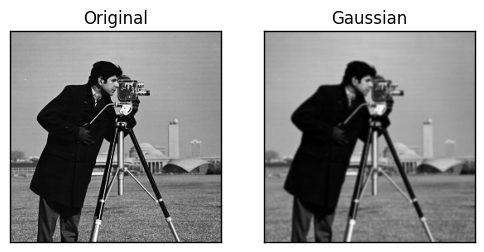

In [67]:
out1 = gaussian(img, sigma = 2)
# Filters used for blurring are low-pass filters
output = [img, out1]

titles = ['Original', 'Gaussian']

for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(titles[i])
    plt.imshow(output[i], cmap = 'gray')
    plt.xticks([]), plt.yticks([])
plt.show()

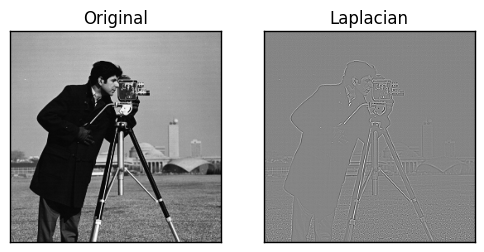

In [66]:
from skimage.filters import laplace

out1 = laplace(img, ksize = 3)

output = [img, out1]
titles = ['Original', 'Laplacian']

for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(titles[i])
    plt.imshow(output[i], cmap = 'gray')
    plt.xticks([]), plt.yticks([])
plt.show()

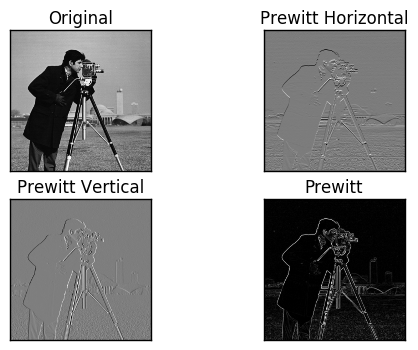

In [65]:
from skimage.filters import prewitt_h, prewitt_v, prewitt
# Filters for detecting the edges are called high-pass filters
out1 = prewitt_h(img)
out2 = prewitt_v(img)
out3 = prewitt(img)

output = [img, out1, out2, out3]
titles = ['Original', 'Prewitt Horizontal', 'Prewitt Vertical', 'Prewitt']

for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.title(titles[i])
    plt.imshow(output[i], cmap = 'gray')
    plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
from skimage.filters import scharr_h, scharr_v, scharr

out1 = scharr_h(img)
out2 = scharr_v(img)
out3 = scharr(img)

output = [img, out1, out2, out3]
titles = ['Original', 'Scharr Horizontal', 'Scharr Vertical', 'Scharr']

for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.title(titles[i])
    plt.imshow(output[i], cmap = 'gray')
    plt.xticks([]), plt.yticks([])
plt.show()


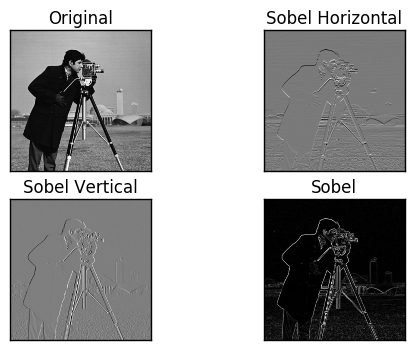

In [62]:
%matplotlib inline

from skimage.data import camera
from skimage.filters import sobel_h, sobel_v, sobel
from matplotlib import pyplot as plt

image = camera()
out1 = sobel_h(image)
out2 = sobel_v(image)
out3 = sobel(image)

output = [image, out1, out2, out3]
titles = ['Original', 'Sobel Horizontal', 'Sobel Vertical', 'Sobel']

for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.title(titles[i])
    plt.imshow(output[i], cmap = 'gray')
    plt.xticks([]), plt.yticks([])
plt.show()

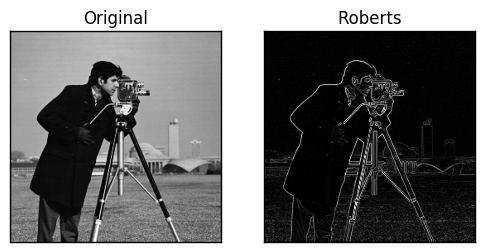

In [63]:
from skimage.filters import roberts

out1 = roberts(image)

output = [image, out1]
titles = ['Original', 'Roberts']

for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(titles[i])
    plt.imshow(output[i], cmap = 'gray')
    plt.xticks([]), plt.yticks([])
plt.show()

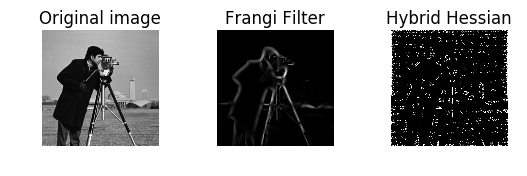

In [64]:
from skimage.filters import frangi, hessian

images = [image, frangi(image), hessian(image)]
titles = ['Original image', 'Frangi Filter', 'Hybrid Hessian']

plt.subplots_adjust(wspace = 0.5, hspace = 0.5)

for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(images[i], cmap = plt.cm.gray)
    plt.title(titles[i])
    plt.axis('off')

plt.show()

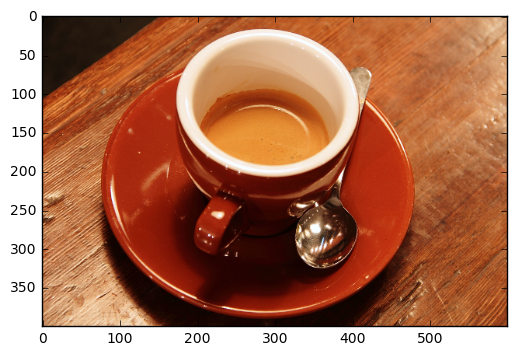

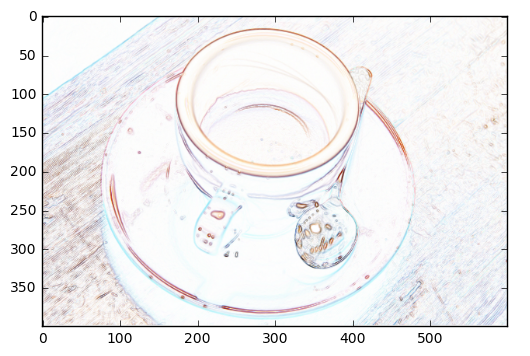

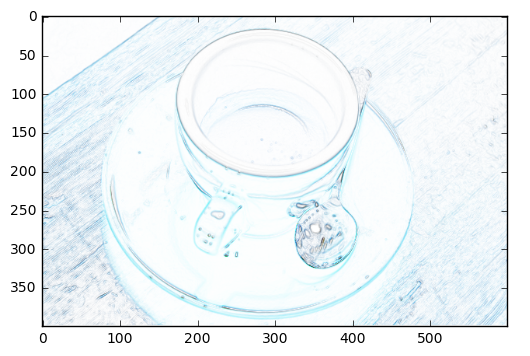

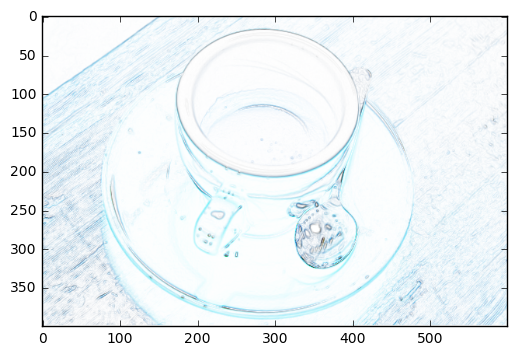

In [73]:
%matplotlib inline
from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage import filters
from skimage import data
from skimage.exposure import rescale_intensity
import matplotlib.pyplot as plt

@adapt_rgb(each_channel)
def scharr_each(image):
    return filters.scharr(image)

@adapt_rgb(hsv_value)
def scharr_hsv(image):
    return filters.scharr(image)

@adapt_rgb(hsv_value)
def sobel_hsv(image):
    return filters.sobel(image)

image = data.coffee()
out1 = rescale_intensity(1 - scharr_each(image))
out2 = rescale_intensity(1 - scharr_hsv(image))
out3 = rescale_intensity(1 - sobel_hsv(image))

plt.imshow(image)
plt.show()

plt.imshow(out1)
plt.show()

plt.imshow(out2)
plt.show()

plt.imshow(out3)
plt.show()

# Morphology

In [74]:
%matplotlib inline
from skimage import morphology
import numpy as np

print(morphology.square(4, np.uint8))
print('\n')

[[1 1 1 1]
 [1 1 1 1]
 [1 1 1 1]
 [1 1 1 1]]




In [75]:
print(morphology.rectangle(6, 2, np.float16))
print('\n')

[[ 1.  1.]
 [ 1.  1.]
 [ 1.  1.]
 [ 1.  1.]
 [ 1.  1.]
 [ 1.  1.]]




In [76]:
print(morphology.diamond(4, np.float16))
print('\n')

[[ 0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  1.  1.  1.  0.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  0.  1.  1.  1.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.]]




In [77]:
print(morphology.disk(4, np.float16))
print('\n')

[[ 0.  0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.  0.]]




In [78]:
print(morphology.cube(4, np.float16))
print('\n')

[[[ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]]

 [[ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]]

 [[ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]]

 [[ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]
  [ 1.  1.  1.  1.]]]




In [79]:
print(morphology.octahedron(4, np.float16))
print('\n')

[[[ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  1.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  1.  0.  0.  0.  0.]
  [ 0.  0.  0.  1.  1.  1.  0.  0.  0.]
  [ 0.  0.  0.  0.  1.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  1.  0.  0.  0.  0.]
  [ 0.  0.  0.  1.  1.  1.  0.  0.  0.]
  [ 0.  0.  1.  1.  1.  1.  1.  0.  0.]
  [ 0.  0.  0.  1.  1.  1.  0.  0.  0.]
  [ 0.  0.  0.  0.  1.  0.  0.  0.  

In [80]:
print(morphology.ball(3, np.float16))
print('\n')

[[[ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  1.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  0.  1.  1.  1.  0.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  0.  1.  1.  1.  0.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  0.  0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  1.  0.  0.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 1.  1.  1.  1.  1.  1.  1.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  0.  0.  1.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.  0.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]
  [ 0.  1.  1.  1.  1.  1.  0.]


In [82]:
print(morphology.octagon(3, 4, np.float16))
print('\n')

[[ 0.  0.  0.  0.  1.  1.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  1.  1.  1.  1.  1.  0.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  0.  1.  1.  1.  1.  1.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  1.  1.  0.  0.  0.  0.]]




In [83]:
print(morphology.star(4, np.float16))
print('\n')

[[ 0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
 [ 0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  1.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.]]




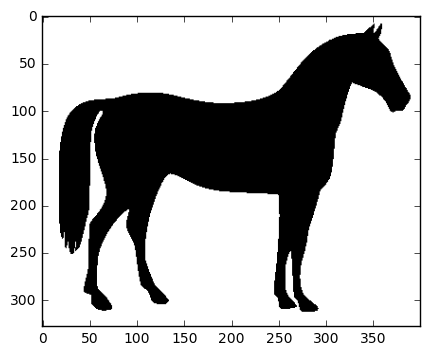

In [85]:
# Implementing morphological operations on binary images
from skimage import data
import matplotlib.pyplot as plt

image = out1 = out2 = out3 = out4 = data.horse()

for i in range(20):
    out1 = morphology.binary_erosion(out1)
    out2 = morphology.binary_dilation(out2)
    out3 = morphology.binary_opening(out3)
    out4 = morphology.binary_closing(out4)

plt.imshow(image, cmap = 'gray')
plt.show()
    

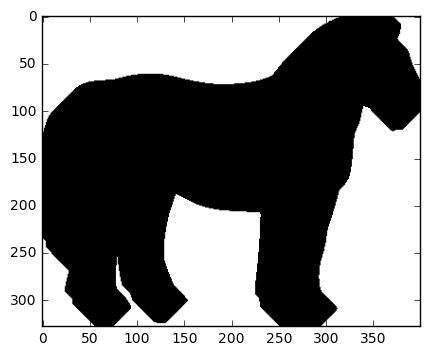

In [87]:
plt.imshow(out1, cmap = 'gray')
plt.show()
    

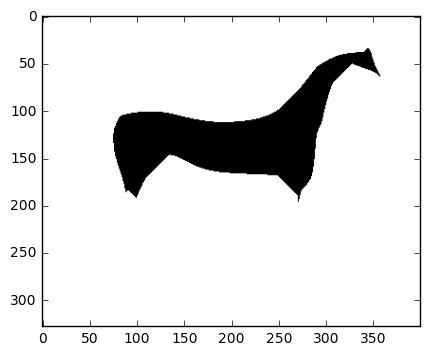

In [88]:
plt.imshow(out2, cmap = 'gray')
plt.show()

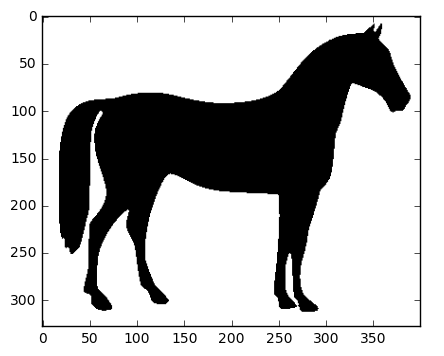

In [89]:
plt.imshow(out3, cmap = 'gray')
plt.show()

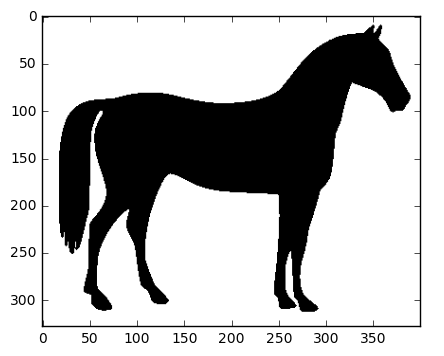

In [91]:
plt.imshow(out4, cmap = 'gray')
plt.show()

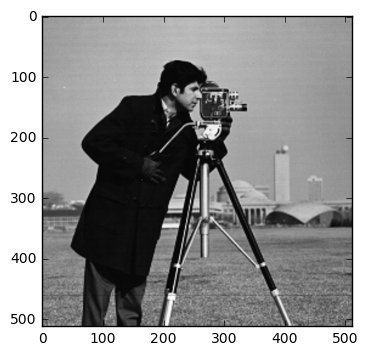

In [92]:
image = out1 = out2 = out3 = out4 = data.camera()

for i in range(20):
    out1 = morphology.erosion(out1)
    out2 = morphology.dilation(out2)
    out3 = morphology.opening(out3) # For binary noise
    out4 = morphology.closing(out4) # For binary noise

plt.imshow(image, cmap = 'gray')
plt.show()

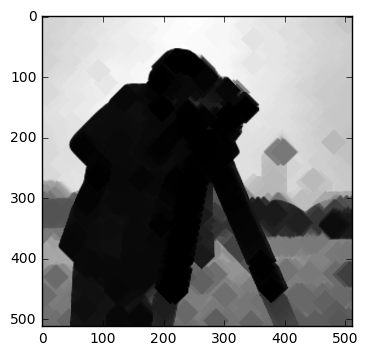

In [95]:
plt.imshow(out1, cmap = 'gray')
plt.show()

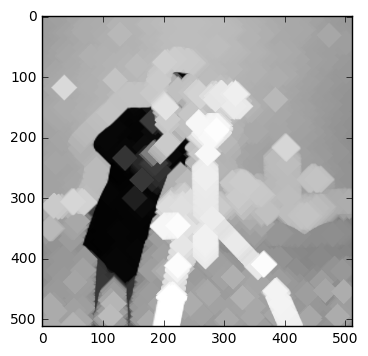

In [94]:
plt.imshow(out2, cmap = 'gray')
plt.show()

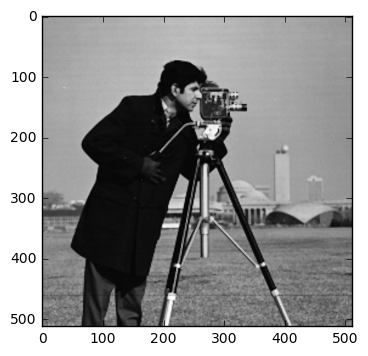

In [96]:
plt.imshow(out3, cmap = 'gray')
plt.show()

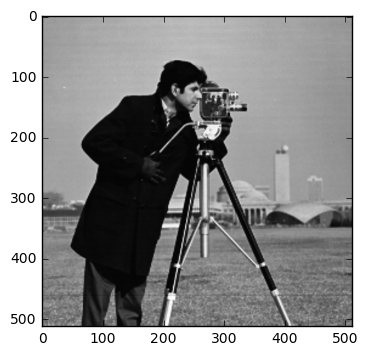

In [97]:
plt.imshow(out4, cmap = 'gray')
plt.show()

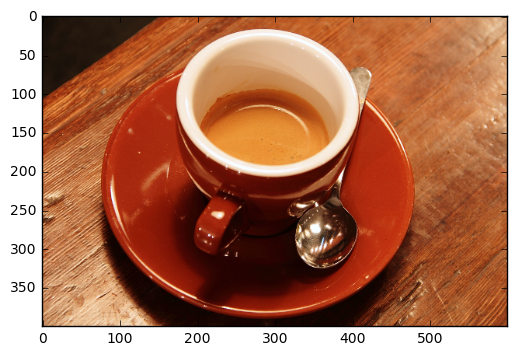

In [98]:
image = out1 = out2 = out3 = out4 = data.coffee()

for i in range(20):
    out1 = morphology.erosion(out1)
    out2 = morphology.dilation(out2)
    out3 = morphology.opening(out3)
    out4 = morphology.closing(out4)

plt.imshow(image)
plt.show()

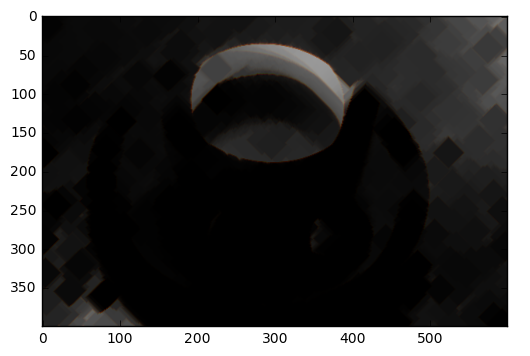

In [99]:
plt.imshow(out1)
plt.show()

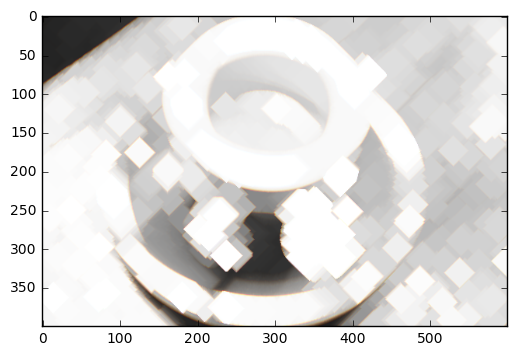

In [100]:
plt.imshow(out2)
plt.show()

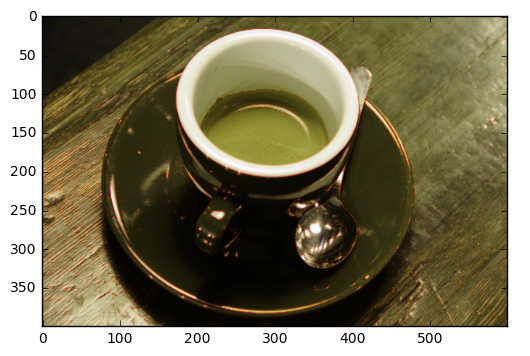

In [101]:
plt.imshow(out3)
plt.show()

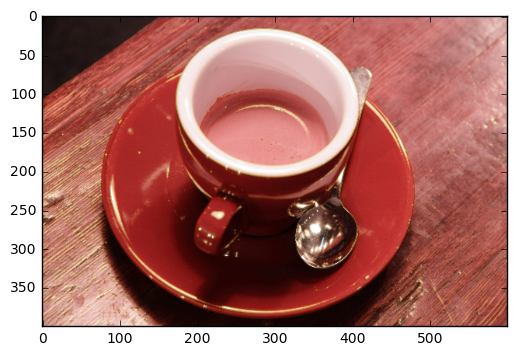

In [102]:
plt.imshow(out4)
plt.show()

# Image Restoration

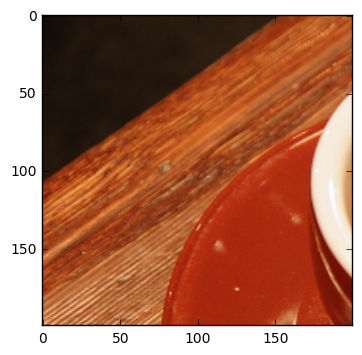

In [103]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.restoration import inpaint

image = data.coffee()[0:200, 0:200]

plt.imshow(image)
plt.show()

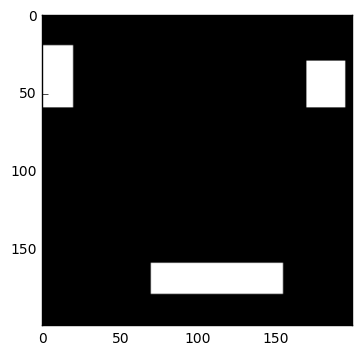

In [107]:
# Create mask with three defect regions: left, middle, right respectively
mask = np.zeros(image.shape[:-1])
# White patches
mask[20:60, 0:20] = 1
mask[160:180, 70:155] = 1
mask[30:60, 170:195] = 1

plt.imshow(mask, cmap = 'gray')
plt.show()

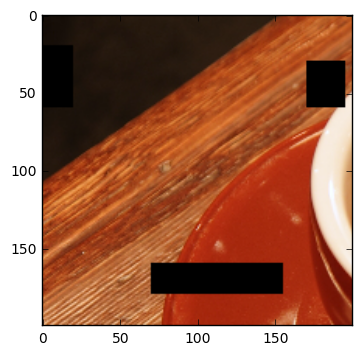

In [105]:
# Defect image over the same region in each color channel
defect = image.copy()
for layer in range(defect.shape[-1]):
    defect[np.where(mask)] = 0

plt.imshow(defect)
plt.show()

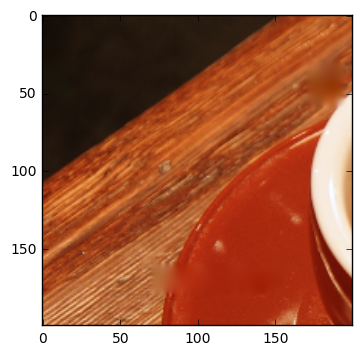

In [106]:
result = inpaint.inpaint_biharmonic(defect, mask, multichannel = True)
plt.imshow(result)
plt.show()

# Noise

In [109]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import random
from skimage import data, img_as_float
from skimage.util import random_noise

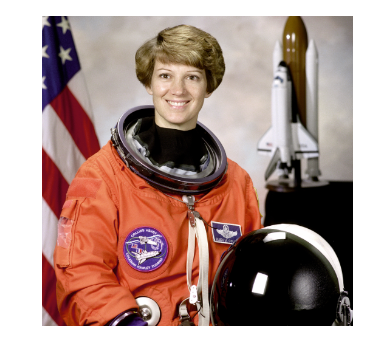

In [110]:
original = img_as_float(data.astronaut())

plt.imshow(original)
plt.axis('off')
plt.show()

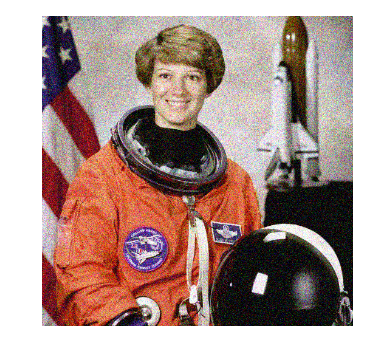

In [111]:
sigma = 0.155
noisy = random_noise(original, var = sigma**2)
plt.imshow(noisy)
plt.axis('off')
plt.show()

In [112]:
s_a_p_noisy = np.zeros(original.shape, np.float64)

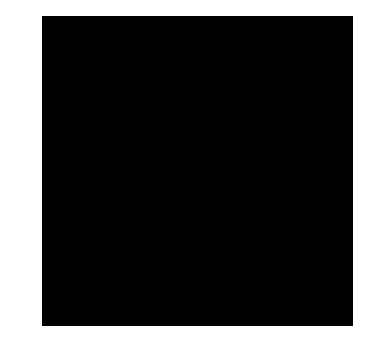

In [113]:
plt.imshow(s_a_p_noisy)
plt.axis('off')
plt.show()

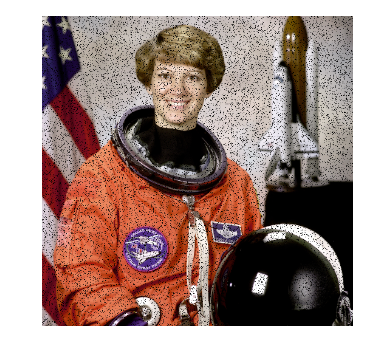

[[[ 21  13   8]
  [ 21  13   9]
  [ 20  11   8]
  ..., 
  [207 116  56]
  [209 113  56]
  [198 105  46]]

 [[ 21  13   7]
  [ 21  13   9]
  [ 20  14   7]
  ..., 
  [190  98  44]
  [190  99  41]
  [190  93  36]]

 [[ 21  14   7]
  [ 23  13  10]
  [ 20  14   9]
  ..., 
  [187  95  41]
  [183  88  33]
  [179  79  28]]

 ..., 
 [[220 153 101]
  [207 146 101]
  [191 123  76]
  ..., 
  [130  34  15]
  [142  48  19]
  [149  56  26]]

 [[190 116  68]
  [197 140 101]
  [246 204 156]
  ..., 
  [121  27   9]
  [132  41  18]
  [143  51  23]]

 [[206 155 115]
  [242 187 142]
  [217 146  83]
  ..., 
  [126  30  12]
  [129  35  11]
  [141  47  22]]]


In [115]:
p = 0.1

for i in range(original.shape[0]):
    for j in range(original.shape[1]):
        r = random.random()
        if r < p/2:
            s_a_p_noisy[i][j] = 0.0, 0.0, 0.0 # Salt
        elif r < p:
            s_a_p_noisy[i][j] = 255.0, 255.0, 255.0 # Pepper
        else:
            s_a_p_noisy[i][j] = original[i][j]

plt.imshow(s_a_p_noisy)
plt.axis('off')
plt.show()

# Noise Removal

In [116]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral, denoise_nl_means, denoise_tv_bregman)
from skimage import data, img_as_float
from skimage.util import random_noise

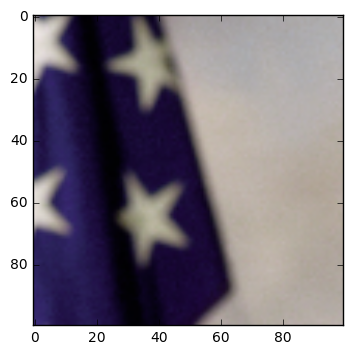

In [117]:
original = img_as_float(data.astronaut()[0:100, 0:100])

plt.imshow(original)
plt.show()

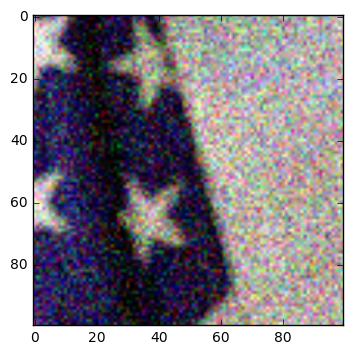

In [118]:
sigma = 0.155
noisy = random_noise(original, var = sigma**2)

plt.imshow(noisy)
plt.show()

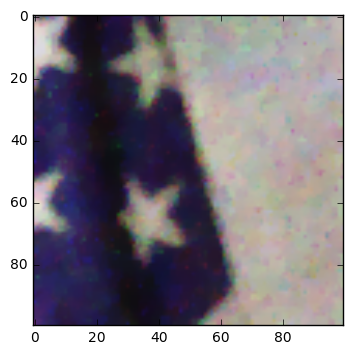

In [119]:
output1 = denoise_tv_chambolle(noisy, weight = 0.1, multichannel = True)
plt.imshow(output1)
plt.show()

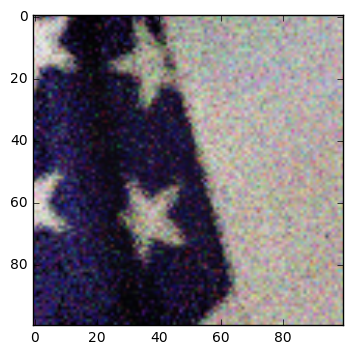

In [120]:
output2 = denoise_bilateral(noisy, sigma_color = 0.05, sigma_spatial = 15, multichannel=True)
plt.imshow(output2)
plt.show()

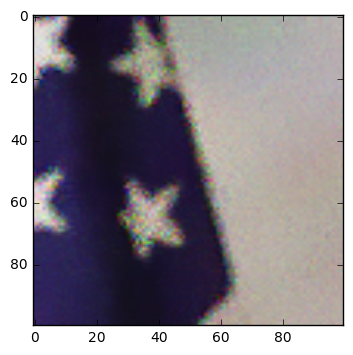

In [121]:
output3 = denoise_nl_means(noisy, multichannel = True)
plt.imshow(output3)
plt.show()

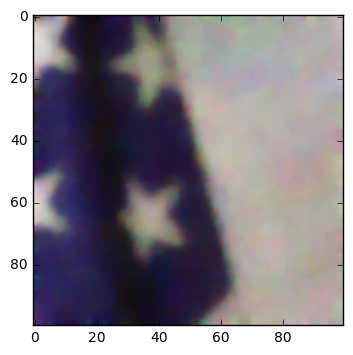

In [122]:
output4 = denoise_tv_bregman(noisy, weight = 2)
plt.imshow(output4)
plt.show()

# Canny Edge Detection

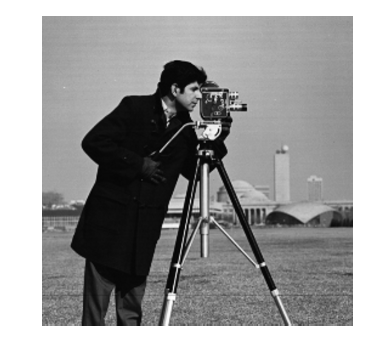

In [128]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from skimage import feature, data

original = data.camera()

plt.imshow(original, cmap = 'gray')
plt.axis('off')
plt.show()

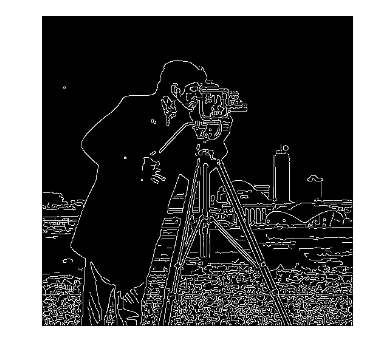

In [125]:
edges1 = feature.canny(original)
# by default sigma = 1

plt.imshow(edges1, cmap = 'gray')
plt.axis('off')
plt.show()

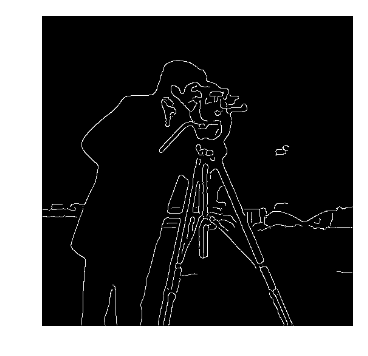

In [126]:
edges2 = feature.canny(original, sigma = 3)

plt.imshow(edges2, cmap = 'gray')
plt.axis('off')
plt.show()

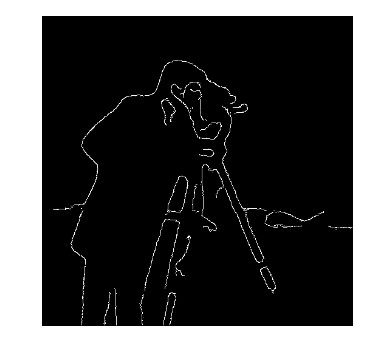

In [127]:
edges3 = feature.canny(original, sigma = 5)

plt.imshow(edges3, cmap = 'gray')
plt.axis('off')
plt.show()

# Harris Corner Detection

In [133]:
%matplotlib inline
from matplotlib import pyplot as plt
from skimage import data
from skimage.feature import corner_harris, corner_subpix, corner_peaks
from skimage.transform import warp, AffineTransform
from skimage.draw import ellipse

In [137]:
tform = AffineTransform(scale = (1.3, 1.1), rotation = 1, shear = 0.7,
                        translation = (210, 50))
image = warp(data.checkerboard(), tform.inverse, output_shape = (350, 350))
rr, cc = ellipse(310, 175, 10, 100)
image[rr, cc] = 1
image[180:230, 10:60] = 1
image[230:280, 60:110] = 1

In [136]:
coords = corner_peaks(corner_harris(image), min_distance = 5)
print(coords)
coords_subpix = corner_subpix(image, coords, window_size = 13)
print(coords_subpix)

[[ 26  21]
 [ 33  76]
 [ 40 130]
 [ 47 185]
 [ 49  11]
 [ 50 210]
 [ 51  35]
 [ 54  62]
 [ 60  93]
 [ 62 117]
 [ 65 144]
 [ 71 175]
 [ 74 202]
 [ 76 226]
 [ 78  52]
 [ 82  80]
 [ 88 111]
 [ 91 138]
 [ 92 161]
 [ 96 189]
 [102 220]
 [104  46]
 [108  74]
 [109  97]
 [113 125]
 [119 156]
 [122 183]
 [123 206]
 [127 234]
 [131 261]
 [135  91]
 [139 119]
 [140 142]
 [143 169]
 [150 201]
 [151 224]
 [154 251]
 [159  82]
 [160 105]
 [166 136]
 [170 164]
 [171 187]
 [174 214]
 [180  10]
 [180  59]
 [180 245]
 [182 269]
 [185 296]
 [188 123]
 [191 150]
 [197 181]
 [201 209]
 [202 232]
 [208 263]
 [211 290]
 [214 117]
 [217 144]
 [219 168]
 [225 199]
 [228 226]
 [229  10]
 [229  59]
 [229 249]
 [230 109]
 [233 277]
 [239 308]
 [240 331]
 [242 158]
 [250 213]
 [257 267]
 [264 322]
 [279  60]
 [279 109]
 [310  76]
 [310 274]]
[[  24.87265141   19.5258441 ]
 [  31.9501212    74.07540339]
 [  39.03251253  128.60455845]
 [  46.10663718  183.14817505]
 [  48.63570705    9.84450384]
 [  49.5284136   21

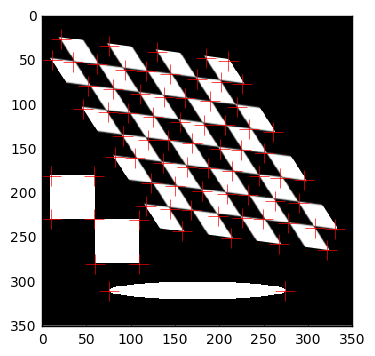

In [132]:
plt.imshow(image, interpolation = 'nearest', cmap = 'gray')
#plt.plot(coords_subpix[:, 1], coords_subpix[:, 0], '+r', markersize=15)
plt.plot(coords[:, 1], coords[:, 0], '+r', markersize = 15)
plt.axis((0, 350, 350, 0))
plt.show()

# SLIC Segmentation

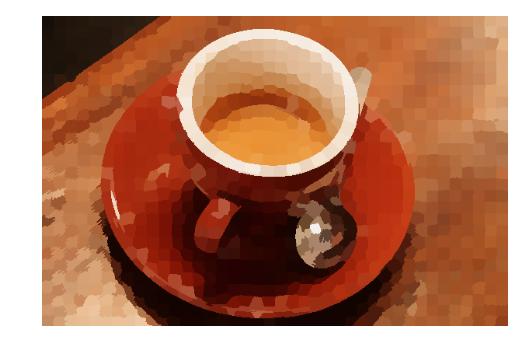

In [158]:
# Simple Linear Iterative Clustering
%matplotlib inline
from skimage import data, segmentation, color
from skimage.future import graph
from matplotlib import pyplot as plt

img = data.coffee()

labels = segmentation.slic(img, compactness = 30, n_segments = 1000)
out = color.label2rgb(labels, img, kind = 'avg')

plt.imshow(out)
plt.axis('off')
plt.show()

# Tinting Greyscale Images

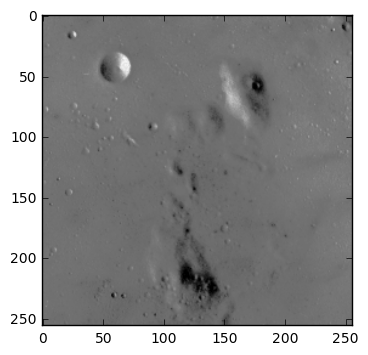

In [152]:
%matplotlib inline

import matplotlib.pyplot as plt
from skimage import data, color, img_as_float

grayscale_image = img_as_float(data.moon()[::2, ::2])
image = color.gray2rgb(grayscale_image)

plt.imshow(image)
plt.show()

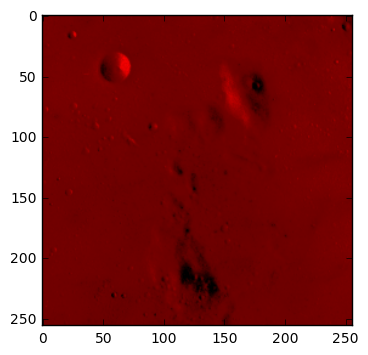

In [153]:
red_multiplier = [1, 0, 0]
output1 = image * red_multiplier
plt.imshow(output1)
plt.show()

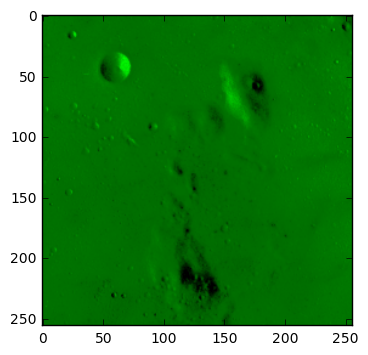

In [154]:
green_multiplier = [0, 1, 0]
output2 = image * green_multiplier
plt.imshow(output2)
plt.show()

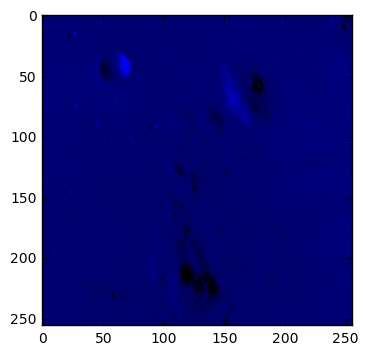

In [155]:
blue_multiplier = [0, 0, 1]
output3 = image * blue_multiplier
plt.imshow(output3)
plt.show()

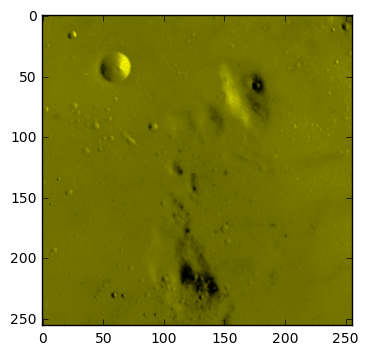

In [156]:
yellow_multiplier = [1, 1, 0]
output4 = image * yellow_multiplier
plt.imshow(output4)
plt.show()

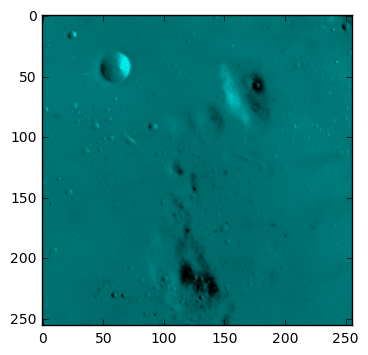

In [157]:
yellow_multiplier = [0, 1, 1]
output4 = image * yellow_multiplier
plt.imshow(output4)
plt.show()

# Contours

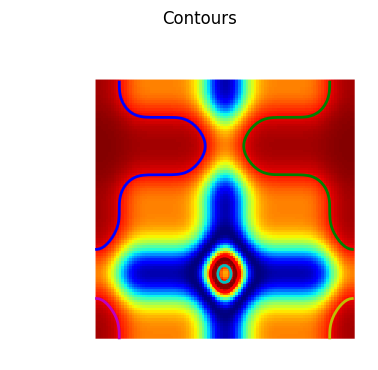

In [162]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

x, y = np.ogrid[-np.pi:np.pi:100j, -np.pi:np.pi:100j]

r = np.cos(np.exp((np.sin(x)**3 + np.cos(y)**5)))



# Find contours at a constant value of 0.8
contours = measure.find_contours(r, 0.8)

# Display the image and plot all contours found

plt.imshow(r, interpolation = 'nearest') #, cmap='gray')
for n, contour in enumerate(contours):
    plt.plot(contour[:, 1], contour[:, 0], linewidth = 2)
plt.title('Contours')
plt.axis('off')
plt.show()

# Convex Hull

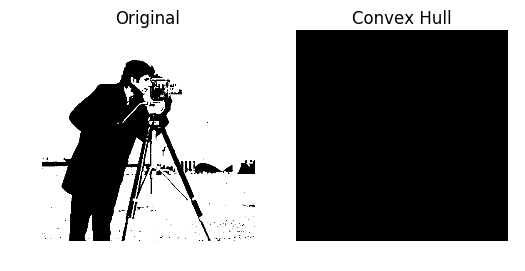

In [164]:
%matplotlib inline
import matplotlib.pyplot as plt
from skimage.morphology import convex_hull_image
from skimage import data, img_as_float
from skimage.filters import threshold_otsu
import numpy as np

image = data.camera()

thresh = threshold_otsu(image)
binary = image > thresh
binaryneg = image < thresh

c_hull = convex_hull_image(binary)

output = [binary, c_hull]
titles = ['Original', 'Convex Hull']

for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.imshow(output[i], cmap = 'gray')
    plt.title(titles[i])
    plt.axis('off')
plt.show()

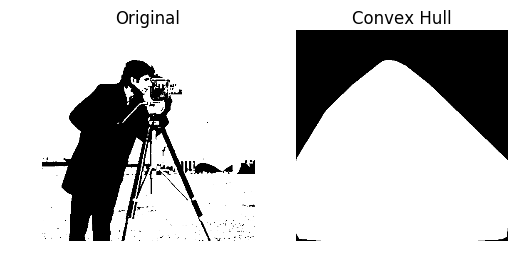

In [165]:
c_hull = convex_hull_image(binaryneg)
output = [binaryneg, c_hull]
output = [binary, c_hull]
titles = ['Original', 'Convex Hull']

for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.imshow(output[i], cmap = 'gray')
    plt.title(titles[i])
    plt.axis('off')
plt.show()

# Skeletonization

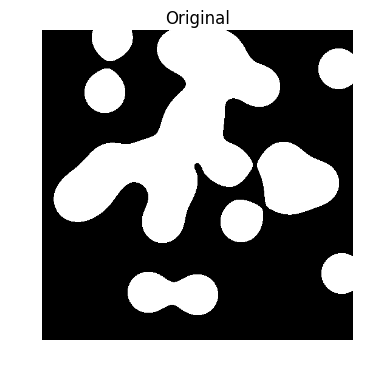

In [166]:
%matplotlib inline
from skimage.morphology import medial_axis, skeletonize, skeletonize_3d
import matplotlib.pyplot as plt
from skimage.data import binary_blobs

# Generate the data
data = binary_blobs(512, blob_size_fraction=.2, volume_fraction=.35, seed=2)
plt.imshow(data, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.show()

C:\Users\Saanika\Anaconda3\lib\site-packages\numpy\ma\core.py:6385: MaskedArrayFutureWarning: In the future the default for ma.minimum.reduce will be axis=0, not the current None, to match np.minimum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)
C:\Users\Saanika\Anaconda3\lib\site-packages\numpy\ma\core.py:6385: MaskedArrayFutureWarning: In the future the default for ma.maximum.reduce will be axis=0, not the current None, to match np.maximum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)


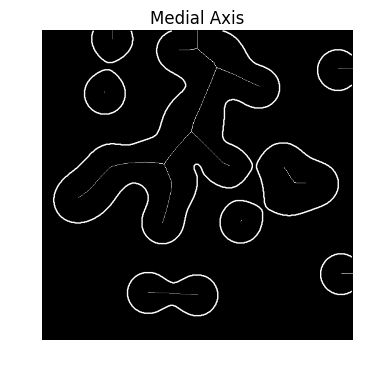

In [170]:
# Compute the medial axis (skeleton) and the distance transform
skel, distance = medial_axis(data, return_distance = True)
# Distance to the background for pixels of the skeleton
dist_on_skel = distance * skel
plt.imshow(dist_on_skel, cmap = 'gray')
plt.contour(data, [0.5], colors = 'w')
plt.title('Medial Axis')
plt.axis('off')
plt.show()

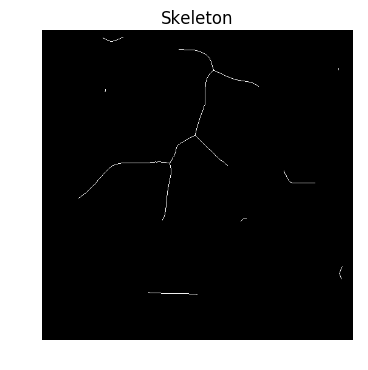

In [168]:
# Compare with other skeletonization algorithms
skeleton = skeletonize(data)
plt.imshow(skeleton, cmap = 'gray')
plt.title('Skeleton')
plt.axis('off')
plt.show()

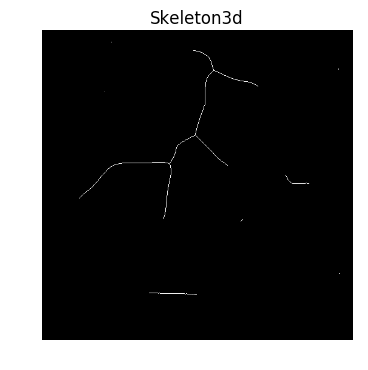

In [169]:
skeleton3d = skeletonize_3d(data)
plt.imshow(skeleton3d, cmap = 'gray')
plt.title('Skeleton3d')
plt.axis('off')
plt.show()